In [47]:
# Installs

In [48]:
# Imports
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import librosa
import scipy

# Introduction

This paper tackles the issue of how to generate sounds that are recognized as belonging to distinct families (such as strings, brass, etc.), while at the same time allowing for different instruments in each family (such as violin, viola, etc.) to be clearly distinguishable from one another. However as  the composer obviously wants also to have more or less complete control over pitch, loudness, vibrato, and other features, the overall problem is quite complex. The method in this paper follows three main steps to compose the digital piece Pine Ridge:

1. A few typical notes (perhaps a tune) played on one member of the family are recorded and digitized.

2. A linear predictive analysis is performed on the notes and the results stored in largescale memory (e.g., on a disk). Each frame represents an all-pole synthesis filter with transfer function 1/D(z).

3. Synthesis is carried out with the generalpurpose program Music 4BF (Howe 1975), which in effect acts as an orchestra. Each instrument is synthesized by use of the frame filters with transfer functions 1/D obtained in step 2 by linear predictive analysis, except that the excitation signals are determined by the instantaneous pitch requirements of the composer and the filters used have undergone frequency transformations to change the effective timbre of the instrument. 

# Recording and Digitization

The starting material for Pine Ridge was a tune of 10 notes lasting about 11 sec and played on a violin
by Cyrus Stevens. Analog-to-digital conversion was done with a sampling rate of 14 KHz and 12 bits. This was the only sound used to produce the entire piece. 

In [49]:
# Single Violin Recordings

data, srate = librosa.load('./violin_d.wav')
D_FREQ = 587.33

print(data.shape[0], srate)
ipd.Audio(data, rate=srate)

129714 22050


# LPC (Linear Predictive Coding)

Eighteen poles and 250-point (17.9 msec) frames were used. The original signal was preemphasized by the highpass filter with transfer function (1 - z<sup>-1</sup>). The frames were not contiguous, but overlapped by 125 points, or 50%. That is, each new frame consisted of the last half of the previous frame followed by the first half of the next. This amount of overlap enables linear interpolation of predictor coefficients without instability. Any poles at radius R > 0.998 were then moved to a radius of 0.998.

In [50]:
# LPC and Covariance Normalization
# Used LPC code from https://github.com/gtzan/synthesizers_cs_perspective/blob/main/src/notebooks/subtractive_lpc_synthcsp.ipynb

# This function is copied directly from https://github.com/cournape/talkbox/blob/master/scikits/talkbox/linpred/py_lpc.py
# Copyright (c) 2008 Cournapeau David
# (MIT licensed)
def levinson_1d(r, order):
    """Levinson-Durbin recursion, to efficiently solve symmetric linear systems
    with toeplitz structure.

    Parameters
    ---------
    r : array-like
        input array to invert (since the matrix is symmetric Toeplitz, the
        corresponding pxp matrix is defined by p items only). Generally the
        autocorrelation of the signal for linear prediction coefficients
        estimation. The first item must be a non zero real.

    Notes
    ----
    This implementation is in python, hence unsuitable for any serious
    computation. Use it as educational and reference purpose only.

    Levinson is a well-known algorithm to solve the Hermitian toeplitz
    equation:

                       _          _
        -R[1] = R[0]   R[1]   ... R[p-1]    a[1]
         :      :      :          :      *  :
         :      :      :          _      *  :
        -R[p] = R[p-1] R[p-2] ... R[0]      a[p]
                       _
    with respect to a (  is the complex conjugate). Using the special symmetry
    in the matrix, the inversion can be done in O(p^2) instead of O(p^3).
    """
    r = np.atleast_1d(r)
    if r.ndim > 1:
        raise ValueError("Only rank 1 are supported for now.")

    n = r.size
    if n < 1:
        raise ValueError("Cannot operate on empty array !")
    elif order > n - 1:
        raise ValueError("Order should be <= size-1")

    if not np.isreal(r[0]):
        raise ValueError("First item of input must be real.")
    elif not np.isfinite(1/r[0]):
        raise ValueError("First item should be != 0")

    # Estimated coefficients
    a = np.empty(order+1, r.dtype)
    # temporary array
    t = np.empty(order+1, r.dtype)
    # Reflection coefficients
    k = np.empty(order, r.dtype)

    a[0] = 1.
    e = r[0]

    for i in range(1, order+1):
        acc = r[i]
        for j in range(1, i):
            acc += a[j] * r[i-j]
        k[i-1] = -acc / e
        a[i] = k[i-1]

        for j in range(order):
            t[j] = a[j]

        for j in range(1, i):
            a[j] += k[i-1] * np.conj(t[i-j])

        e *= 1 - k[i-1] * np.conj(k[i-1])

    return a, e, k

def lpc(wave, order):
    """Compute LPC of the waveform. 
    a: the LPC coefficients
    e: the total error
    k: the reflection coefficients
    
    Typically only a is required.
    """    
    # only use right half of autocorrelation, normalised by total length
    autocorr = scipy.signal.correlate(wave, wave)[len(wave)-1:]/len(wave)
    a, e, k  = levinson_1d(autocorr, order)
    return a,e,k

def lpc_process(input, win_size, hop_size, order, excitation, srate=srate): 
    # precompute the hamming window
    window = scipy.signal.hann(win_size)
    output= np.zeros(len(input)+win_size)   

    # plot([window])
    for i in range(0,len(input),hop_size):
        # slice the audio into overlapping frames 
        frame = input[i:i+win_size]
        excitation_frame = excitation[i:i+win_size]
       
        if len(frame)==win_size: 
            a,error,reflection = lpc(frame, order)
            lpc_residual = scipy.signal.lfilter(a, 1., frame) 
            # excitation_frame = lpc_residual
            lpc_output = scipy.signal.lfilter([1.], a, excitation_frame)             
            voc_amp = 1e-5+np.sqrt(np.mean(lpc_output**2))
            wave_amp = 1e-5+np.sqrt(np.mean(frame**2))
            lpc_output = lpc_output * (wave_amp/voc_amp)
            output[i:i+win_size] += (lpc_output * window)  

    return output 

def modFMbuzz(samples, f, sr, k, phase_shift=0):
    """Generate a pulse train using modfm:
        y(t) = cos(x(t)) * exp(cos(x(t))*k - k)
        
        samples: number of samples to generate
        f: base frequency (Hz)
        sr: sample rate (Hz)
        k: modulation depth; higher has more harmonics but increases risk of aliasing
        (e.g. k=1000 for f=50, k=100 for f=200, k=2 for f=4000)        
    
    """
    t = np.arange(samples)
    phase = (f*2*np.pi * (t/float(sr)) + phase_shift)
    # simple pulse oscillator (ModFM)
    buzz = np.cos(phase) * np.exp(np.cos(phase)*k-k)    
    return buzz

buzz = modFMbuzz(len(data), D_FREQ, srate, k=5**np.linspace(2,4,len(data)))
poles = 18
output = lpc_process(data, 250, 125, poles, buzz)
ipd.Audio(output, rate=srate)

# Excitation

Deviations in pitch as much as &pm;$\frac{1}{3}$ of a semitone were observed. A semitone is a frequency ratio of 2<sup>1/12</sup>, or about 6%, so the observed vibrato was as much as &pm;2% in pitch. Furthermore, the
higher formants of the linear predictive analysis moved in a way correlated with the pitch, possibly because the higher formants were tracking harmonics of the excitation signal. This was accomplished by transposing the original pitch contour to the desired pitch and by using the transposed pitch contour with the frame filters that corresponded to the original pitch contour. Preserving the correlation between vibrato in pitch and formant structure seemed to improve the realism of the synthesis.

A table lookup of a closed-form expression for a harmonic series was used with a flat spectrum. Its spectrum was then shaped by a 2-pole bandpass filter, always centered at the fundamental, with a bandwidth of about 1500Hz. The resultant harmonic series descends in amplitude monotonically and is a gross approximation of the spectrum of a triangular waveform, which is probably a good source for a bowed instrument.

In addition to transposing the original pitchtracking data, the pitch was subjected to random deviations of &pm;0.1 semitone. Seven such versions of each instrument, with different phases, were added to create the effect of an orchestral section rather than a single instrument.

In [51]:
# Vibrato, random, multiply by 7
# Used bandpass code ideas from https://github.com/gtzan/synthesizers_cs_perspective/blob/main/src/notebooks/digital_filters.ipynb

def add_vibrato(input, vibrato_rate=7, vibrato_amount=0.02):
    vibrato_t = np.arange(len(input))
    vibrato_signal = np.sin(2 * np.pi * vibrato_rate * (vibrato_t/float(srate))) * vibrato_amount
    return input + vibrato_signal

def band_pass(audio, freq, q, srate): 
    b = np.zeros(3)
    a = np.zeros(3)
    # center frequency in radians 
    frad = 2 * np.pi * freq / srate 
    # bandpass formulas 
    alpha_ = np.sin(frad)/(2*q)
    b[0] = np.sin(frad)/2
    b[1] =  0
    b[2] = -np.sin(frad)/2
    a[0] = 1 + alpha_
    a[1] = -2 * np.cos(frad) 
    a[2] = 1 - alpha_
    # apply filter once
    filtered_audio = scipy.signal.lfilter(b, a, audio)
    return filtered_audio

def orchestrasize(input, freq = D_FREQ, random_amount=0.006, phases=7):
    result = []
    for phase in np.linspace(0, 2*np.pi, phases):
        random_factor = 1 + np.random.uniform(-random_amount, random_amount)
        new_freq = freq*random_factor
        buzz = modFMbuzz(len(input), new_freq, srate, k=5**np.linspace(2,4,len(input)), phase_shift=phase)
        poles = 18
        output = lpc_process(input, 250, 125, poles, buzz)
        vibrato_output = add_vibrato(output)
        excited_output= band_pass(vibrato_output, new_freq, 15, srate)
        result.append(excited_output)
    data = np.vstack(result)
    return np.sum(data, axis=0)

violin_section = orchestrasize(data, D_FREQ)
ipd.Audio(violin_section, rate=srate)


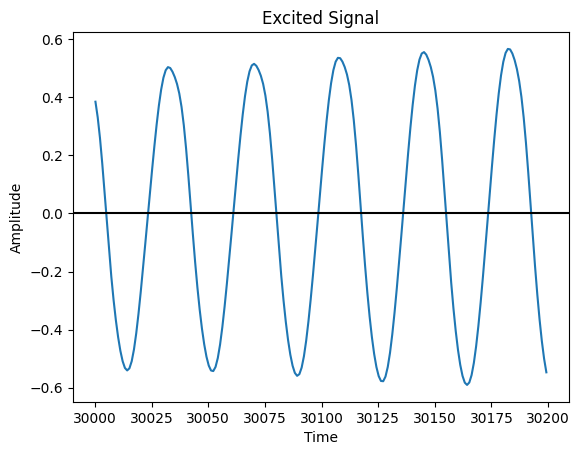

In [66]:
vibrato_output = add_vibrato(output)
excited_output= band_pass(vibrato_output, D_FREQ, 15, srate)
t = np.linspace(0,len(excited_output), len(excited_output))
plt.plot(t[30000:30200], excited_output[30000:30200])
plt.title('Excited Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.axhline(y=0, color='k')
plt.show()

# Warping transform filter

To transform (warp) the frequency axis use the all-pass function
$$
A(z) = \frac{d+z^{-1}}{1+dz^{-1}}
$$

If the original frame filter has the transfer function
$$
\frac{1}{D(z)} = \frac{1}{1+\sum_{i=1}^{L}{b_iz^{-1}}}
$$

The structure of the warp filter is shown here
<div>
<img src="./warp_filter_structure.png" width="350"/>
</div>

The effect of the transformation is to map the frequency axis by
$$
\phi(\omega) = \omega - 2\arctan(\frac{d\sin(\omega)}{1+d\cos(\omega)})
$$

Therefore, if the original transfer function has a formant at $\omega = \omega_o$, the new transfer function will have one when $\phi(\omega) = \omega_0$. This shows that when 0 < d < 1, formants are shifted up and when -1 < d < 0, formants are shifted down. To a second-order approximation in $\omega$, $\phi(\omega)$ is linear at the origin, with slope
$$
\phi'(0) = \frac{1-d}{1+d'}
$$

so for small $\omega$, a formant at $\omega_0$ will be shifted to approximately $[(1 + d)/( 1- d)]\omega_0$.

The frequency-warping process as an approximate way of scaling the psychoacoustic size of the instrument. For example, in applying this technique to speech the lowering of a woman's vocal formants gives the impression of a larger but still feminine source, while raising the formants gives the distinct impression of a young girl's voice. 

In the family of string instruments, a viola is tuned 7 semitones lower than a violin, a violoncello
19 semitones lower, and a double bass 27 semitones lower. It can be assumed that instrument sizes and formant structures are related in roughly this way and used the values of d obtained from
$$
\frac{1+d}{1-d} = 2^{-7/12}, 2^{-19/12}, 2^{-27/12}
$$
$$
d =  -0.19946, -0.49958, -0.65259
$$

In [53]:
# Adjust transform by calculated numbers

violin_shift = 0
viola_shift = -0.19946
cello_shift = -0.49958
bass_shift = -0.65259

VIOLIN_FREQ = D_FREQ
VIOLA_FREQ = 392.00
CELLO_FREQ = 196.00
BASS_FREQ = 123.47

def warp_filter(w,d):
    wy = w - 2*np.arctan((d*np.sin(w))/(1+d*np.cos(w)))
    return wy

def warp_lpc_process(input, d, win_size, hop_size, order, excitation, srate=srate): 
    # precompute the hamming window
    window = scipy.signal.hann(win_size)
    output= np.zeros(len(input)+win_size)   

    # plot([window])
    for i in range(0,len(input),hop_size):
        # slice the audio into overlapping frames 
        frame = input[i:i+win_size]
        excitation_frame = excitation[i:i+win_size]
       
        if len(frame)==win_size: 
            a,error,reflection = lpc(frame, order)
            r = np.roots(a)  
            r = r[np.imag(r)>=0]
            r = r[np.abs(r)<0.998]
            theta = np.arctan2(np.imag(r), np.real(r))
            idx = np.argsort(theta)
            r = r[idx]
            formants = (srate / (2*np.pi)) * np.arccos(-np.real(r))
            formants = warp_filter(formants, d)
            r = -np.cos(formants * (2*np.pi/ srate))
            a = np.poly(np.real(r))
            lpc_residual = scipy.signal.lfilter(a, 1., frame) 
            # excitation_frame = lpc_residual
            lpc_output = scipy.signal.lfilter([1.], a, excitation_frame)             
            voc_amp = 1e-5+np.sqrt(np.mean(lpc_output**2))
            wave_amp = 1e-5+np.sqrt(np.mean(frame**2))
            lpc_output = lpc_output * (wave_amp/voc_amp)
            output[i:i+win_size] += (lpc_output * window)  

    return output 

def warp_orchestrasize(input, d, freq = D_FREQ, random_amount=0.006, phases=7):
    result = []
    for phase in np.linspace(0, 2*np.pi, phases):
        random_factor = 1 + np.random.uniform(-random_amount, random_amount)
        new_freq = freq*random_factor
        buzz = modFMbuzz(len(input), new_freq, srate, k=5**np.linspace(2,4,len(input)), phase_shift=phase)
        poles = 18
        output = warp_lpc_process(input, d, 250, 125, poles, buzz)
        vibrato_output = add_vibrato(output)
        excited_output= band_pass(vibrato_output, new_freq, 15, srate)
        result.append(excited_output)
    data = np.vstack(result)
    return np.sum(data, axis=0)

warp_bass_section = warp_orchestrasize(data, bass_shift, BASS_FREQ)
ipd.Audio(warp_bass_section, rate = srate)

In [54]:
warp_cello_section = warp_orchestrasize(data, cello_shift, CELLO_FREQ)
ipd.Audio(warp_cello_section, rate = srate)

In [55]:
warp_viola_section = warp_orchestrasize(data, viola_shift, VIOLA_FREQ)
ipd.Audio(warp_viola_section, rate = srate)

In [56]:
warp_violin_section = warp_orchestrasize(data, violin_shift, VIOLIN_FREQ)
ipd.Audio(warp_violin_section, rate = srate)

In [57]:
warp_violin_section_high = warp_orchestrasize(data, violin_shift, VIOLIN_FREQ*2)
ipd.Audio(warp_violin_section_high, rate = srate)

In [58]:
whole_orchestra = np.vstack([warp_bass_section,warp_cello_section,warp_viola_section,warp_violin_section,warp_violin_section_high])
ipd.Audio(whole_orchestra, rate=srate)

# Conclusion

This paper describes a method that allows alteration ofthe apparent size of such instruments in a methodical way, through careful linear prediction. Using a synthesis program like Music 4BF enables the composer to "play" real-sounding instruments with the computer, and as part of the paper Paul Lansky composed a piece titled Pine Ridge which gives the impression of a performance by an ensemble of strings. The paper concludes that much work remains to be done in applying the method to families of instruments other than strings and in refining the technique.

Here is a short sample of Lansky's composition, Pine Ridge:

In [59]:
pine_ridge, pr_sr = librosa.load("Pine_Ridge_Demo.wav")
ipd.Audio(pine_ridge, rate=pr_sr)

# Future work, ideas, and limitations

Like the paper suggests a further area to explore is through different instruments. As an initial exploration on the techniques described above, the following code will see what happens when these filters are adjusted for the different types of saxophones, but otherwise left unchanged.

The notebook already deviates from the paper as it uses the Levinson-Durbin recursion for LPC coeffients. It only takes in 1 audio sample instead of 11 and also does not attempt to store these generated warped sounds to create music using the Music 4BF software. The paper states that changes in volume with this method can sound artificial because no attempt was made to change the excitation or formants with varying loudness, which can be heard in this notebook especially in the high warped violin sample.

A limitation of this notebook is not having the original violin recordings used for the paper, using a sample from FreeSound.org with a different sampling rate may change what values should be used in comparison to what was used originally in the paper (such as window size or LPC order).

In [60]:
# Do paper but maybe try with something like an alto sax to tenor, baritone, and soprano
sax_data, sax_srate = librosa.load('./alto_sax_d.wav')
alto_shift = 0
tenor_shift = -0.1429
bari_shift = -0.3333
soprano_shift = 0.1991

ALTO_FREQ = D_FREQ
TENOR_FREQ = 440.00
BARI_FREQ = 293.66
SOPRANO_FREQ = 880.00

ipd.Audio(sax_data, rate=sax_srate)


In [61]:
warp_alto_section = warp_orchestrasize(sax_data, alto_shift, ALTO_FREQ)
ipd.Audio(warp_alto_section, rate=sax_srate)

In [62]:
warp_tenor_section = warp_orchestrasize(sax_data, tenor_shift, TENOR_FREQ)
ipd.Audio(warp_tenor_section, rate=sax_srate)

In [63]:
warp_bari_section = warp_orchestrasize(sax_data, bari_shift, BARI_FREQ/2)
ipd.Audio(warp_bari_section, rate=sax_srate)

In [64]:
warp_soprano_section = warp_orchestrasize(sax_data, soprano_shift, SOPRANO_FREQ)
ipd.Audio(warp_soprano_section, rate=sax_srate)

In [65]:
sax_quartet = np.vstack([warp_alto_section,warp_tenor_section,warp_bari_section,warp_soprano_section])
ipd.Audio(sax_quartet, rate=sax_srate)

# Final Thoughts

This sax quartet using the string transformations from Lansky and Steiglitz kind of sounds more like a brass section. Maybe a different excitation signal would produce a more realistic saxophone noise, as well as proper vibrato etc. The formant shifts are just rough approximations from the calculations in the Warp Filter section as well based on the standard tuning for each saxophone.